<a href="https://colab.research.google.com/github/Nolanole/Tanzania-Well-Water-Project/blob/master/Final_Cleaned_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Imports and installs

In [0]:
!pip install pdpbox
!pip install eli5
!pip install category_encoders

In [0]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import category_encoders as ce
import eli5
import pdpbox
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [0]:
#Files

train_features_url = 'https://raw.githubusercontent.com/Nolanole/Tanzania-Well-Water-Project/master/train_features.csv'
test_features_url = 'https://raw.githubusercontent.com/Nolanole/Tanzania-Well-Water-Project/master/test_features.csv'
train_labels_url = 'https://raw.githubusercontent.com/Nolanole/Tanzania-Well-Water-Project/master/train_labels.csv'
sample_submission_url = 'https://raw.githubusercontent.com/Nolanole/Tanzania-Well-Water-Project/master/sample_submission.csv'

#initial dataframes:

train = pd.read_csv(train_features_url)
test = pd.read_csv(test_features_url)
train_target = pd.read_csv(train_labels_url)
sample_submission = pd.read_csv(sample_submission_url)

#merge train and target:
#train = train.merge(train_target)

train['train_test'] = 'train'
test['train_test'] = 'test'

combined = pd.concat([train, test])

#choose bw features that are duplicitave/overlapping info:... check
# - extraction_type,extraction_type_class	and	extraction_type_group (keep extraction_type_group, drop the others)
# - management, scheme_management (drop scheme_management, combine values under other into other)
# - payment, payment_type (exact same, drop either)
# - water_quality, quality_group (same, drop quality_group)
# - quantity, quantity_group (exact same, drop either)
# - source, source_type, source_class (drop source_type, possibly source_class also, but def keep source ())
# - waterpoint_type, waterpoint_type_group (exact same, drop either)
# - geographic info: in order of most specific to least:
#      subvillage, ward, lga, region_code, basin (drop region and district_code)

#drop irrelevant features like 'wpt_name', 'recorded_by'

drop_cols = ['id', 'wpt_name', 'recorded_by', 'extraction_type', 'district_code',
             'extraction_type_class', 'scheme_management', 'payment_type', 'quality_group',
             'quantity_group', 'source_type', 'waterpoint_type_group', 'region']

combined = combined.drop(columns = drop_cols)

###Custom Functions for Cleaning/Wrangling + Imputation strategy and Feature Engineering

In [0]:
#for features that use zero for missing/nan, fill w/ np.nan
def replace_zeros_with_nans(X, replace_zero_cols):
  X = X.copy()
  zeros = [0, '0']
  for col in replace_zero_cols:
    X[col] = X[col].replace(zeros, np.nan)
  for col in X.select_dtypes('object').columns.to_list():
    X[col] = X[col].replace(zeros, np.nan)
  return X

#convert strings to lowercase
def apply_lower(X):
  X = X.copy()
  for col in X.select_dtypes('object').columns.to_list()[1:]:
    try:
      X[col] = X[col].astype('str').apply(str.lower)
    except:
      continue
  return X

#for features that have random vals for nans, fill w/ np.nan
def replace_vals_with_nans(X):
  X = X.copy()
  nans = ['nan', 'not known', 'none', 'unknown', -2e-08, '-', '##', 
          'unknown installer', 'not kno']
  X = X.replace(nans, np.nan) 
  return X

#try to group some messy strings containing common gov or church words together
def clean_funders_installers(X):
  X = X.copy()
  cols = ['funder', 'installer']
  world_vision_words = ['world vision', 'world vission', 'world division', 'world visiin']
  gov_words = ['gov', 'cou', 'nation', 'distric', 'minstry', 'tanza', 'centr', 'wizara ya maji']
  church_words = ['roman', 'churc', 'mission', 'catho', 'menonite', 'rc ch']
  def group(x):
    try:
      for word in world_vision_words:
        if word in x:
          return 'world vision'
      for word in gov_words:
        if word in x:
          return 'gov'
      for word in church_words:
        if word in x:
          return 'church'
        else:
          return x
    except:
      return x
  for col in cols:
    X[col] = X[col].apply(group)
  return X

#group small sample size value counts less than 50:
def consolidate(X, consolidate_cols):
  X = X.copy()
  for col in consolidate_cols:
    vc = X[col].value_counts()
    few_vals = vc[vc < 50].index.tolist()
    X[col] = X[col].replace(few_vals, 'small sample')
    return X

#custom mean imputer for certain features
def mean_impute(X, mean_cols):
  X = X.copy()
  
  for col in mean_cols:
    col_ward_mean = X.groupby('ward')[col].transform('mean')
    col_lga_mean = X.groupby('lga')[col].transform('mean')
    col_region_mean = X.groupby('region_code')[col].transform('mean')
    col_basin_mean =  X.groupby('basin')[col].transform('mean')
    all_data_median = X[col].median()
    
    X[col] = X[col].fillna(col_ward_mean)
    X[col] = X[col].fillna(col_lga_mean)
    X[col] = X[col].fillna(col_region_mean)
    X[col] = X[col].fillna(col_basin_mean)
    X[col] = X[col].fillna(all_data_median)  
  return X

#custom median imputer for certain features
def median_impute(X, mean_cols):
  X = X.copy()
  
  for col in median_cols:
    col_ward_median = X.groupby('ward')[col].transform('median')
    col_lga_median = X.groupby('lga')[col].transform('median')
    col_region_median = X.groupby('region_code')[col].transform('median')
    col_basin_median =  X.groupby('basin')[col].transform('median')
    all_data_median = X[col].median()
    
    X[col] = X[col].fillna(col_ward_median)
    X[col] = X[col].fillna(col_lga_median)
    X[col] = X[col].fillna(col_region_median)
    X[col] = X[col].fillna(col_basin_median)
    X[col] = X[col].fillna(all_data_median)  
  return X

#custom mode imputer for certain features
def mode_impute(X, mode_cols):
  X = X.copy()
  
  def get_mode(x):
    try:
      x = x.value_counts().index[0]
    except:
      pass
    return x

  for col in mode_cols:
    col_ward_mode = X.groupby('ward')[col].transform(get_mode)
    col_lga_mode = X.groupby('lga')[col].transform(get_mode)
    col_region_mode = X.groupby('region_code')[col].transform(get_mode)
    col_basin_mode =  X.groupby('basin')[col].transform(get_mode)
    all_data_mode = X[col].mode()
    
    X[col] = X[col].fillna(col_ward_mode)
    X[col] = X[col].fillna(col_lga_mode)
    X[col] = X[col].fillna(col_region_mode)
    X[col] = X[col].fillna(col_basin_mode)
    X[col] = X[col].fillna(all_data_mode)  
  return X

#engineer log transformed version of certain numeric features
def log_transform(X, log_cols, drop=False):
  X = X.copy()
  def apply_log(x):
    if x == 0:
      return x
    else:
      return np.log(x)
  for col in log_cols:
    X['log_' + col] = X[col].apply(apply_log)
  if drop:
    X = X.drop(columns=[col])
  return X

#convert date to datetime, split into day/month/year, and drop the dt col:
def date_wrangle(X):
  X = X.copy()
  X['date_recorded'] = pd.to_datetime(X['date_recorded'], infer_datetime_format=True)
  X['date_recorded_month'] = X['date_recorded'].dt.month.astype('object')
  X['date_recorded_year'] = X['date_recorded'].dt.year.astype('int')
  X = X.drop(columns='date_recorded')
  
  #date feature engineering:
  season_map = {1:'short dry',2:'short dry',3:'long rains',4:'long rains',
                  5:'long rains',6:'long dry',7:'long dry',8:'long dry',
                  9:'long dry',10:'long dry',11:'short rains',12:'short rains'}
  X['season'] = X['date_recorded_month'].astype('int')
  X['season'] = X['season'].replace(season_map)
  
  X['construction_year'] = X['construction_year'].astype('int')
  X['age_estimate'] = X['date_recorded_year'] - X['construction_year']
  def convert_negs(x):
    if x < 0:
      return np.nan
    else:
      return x
  X['age_estimate'] = X['age_estimate'].apply(convert_negs)
  X = mean_impute(X, ['age_estimate'])
  return X

#group some common values in the management feature
def clean_mgmt(X):
  X = X.copy()
  map = {'private operator':'private','company':'private',
         'other - school':'other', 'trust':'private'}
  X['management'] = X['management'].replace(map)
  return X

#quantity w/ unknown have high correlation w/ broken well, 
#so convert these Nans to string 'unknown'
def clean_quantity(X):
  X = X.copy()
  X['quantity'] = X['quantity'].fillna('unknown')
  return X

#Engineer the location features: Credit to Nico Montoya who found these from a
#diff kaggle competition that used latitude and longitude features

def location_engineer(X):
  X = X.copy()
  
  #scale the latitude and longitude
  from sklearn.preprocessing import StandardScaler
  scaler = StandardScaler()
  scaler.fit(X[['longitude', 'latitude']])
  X[["longitude","latitude"]] = scaler.transform(X[["longitude","latitude"]])
  
  #45 degree rotation
  X["longitude_rot45"] = .707 * X["longitude"] + .707 * X["latitude"] 
  X["latitude_rot45"] = .707 * X["latitude"] - .707 * X["longitude"]
  
  #30 degree rotation:
  X["longitude_rot30"] = (1.732/2) * X["longitude"] + (1./2) * X["latitude"] 
  X["latitude_rot30"] = (1.732/2) * X["latitude"] - (1./2) * X["longitude"]
  
  #60 degree rotation
  X["longitude_rot60"] = (1./2) * X["longitude"] + (1.732/2) * X["latitude"] 
  X["latitude_rot60"] = (1./2) * X["latitude"] - (1.732/2) * X["longitude"]
  
  #radial
  X["radial_r"] = np.sqrt(np.power(X["latitude"], 2) + np.power(X["longitude"], 2))
  
  return X

In [0]:
#define the columns for the wrangling functions:
  
replace_zero_cols = ['construction_year', 'population', 'gps_height', 'longitude', 
                     'amount_tsh']
mean_cols = ['construction_year', 'latitude', 'longitude']
median_cols = ['amount_tsh', 'gps_height', 'population']
mode_cols = ['subvillage', 'funder', 'installer', 'permit', 'public_meeting',
              'scheme_name', 'water_quality', 'source', 'source_class',
              'management', 'management_group', 'payment']
lower_cols = ['funder', 'installer', 'subvillage', 'lga', 'ward', 'scheme_name',
             'extraction_type_group', 'management', 'management_group', 'basin',
             'waterpoint_type', 'source_class', 'source', 'quantity', 'water_quality']
consolidate_cols = ['funder', 'installer']
log_cols = ['population', 'age_estimate']

#call the wrangling functions:
combined = replace_zeros_with_nans(combined, replace_zero_cols)
combined = apply_lower(combined)
combined = replace_vals_with_nans(combined)
combined = clean_funders_installers(combined)
combined = mean_impute(combined, mean_cols)
combined = median_impute(combined, median_cols)
combined = mode_impute(combined, mode_cols)
combined = consolidate(combined, consolidate_cols)
combined = date_wrangle(combined)
combined = log_transform(combined, log_cols)
combined = clean_quantity(clean_mgmt(combined))
combined = location_engineer(combined)


#recast numeric categoricals as object for categorical encoding:
obj_cols = ['region_code', 'public_meeting', 'permit']

def recast_obj(X, obj_cols):
    X = X.copy()
    for col in obj_cols:
      X[col] = X[col].astype('object')
    return X

combined = recast_obj(combined, obj_cols)

###Encode the categorical Features

In [0]:
#Use one-hot encoding for low ordinality features:

one_hot_cols = ['source_class', 'permit', 'management_group', 'quantity', 
                'date_recorded_year', 'payment', 'public_meeting', 'date_recorded_month',
                'waterpoint_type', 'basin', 'source', 'water_quality', 'management',
                'extraction_type_group', 'region_code', 'season']

one_hot_ce = ce.OneHotEncoder(cols=one_hot_cols, verbose=10, use_cat_names=True)

combined = one_hot_ce.fit_transform(combined)

#Use binary encoder for high ordinality features:

binary_cols = ['funder', 'installer', 'subvillage', 'ward', 'scheme_name', 'lga']
              
binary_ce = ce.BinaryEncoder(cols=binary_cols, return_df=True)

combined = binary_ce.fit_transform(combined)

Spoiler alert: These columns had zero importance in eli5 feature importance iterations throught the project. The feature names were manually logged, and will be dropped here befoore running our final models

In [0]:
#drop feautures w/ 0.0 eli5 perumuter importance:
drop_features= [
 'waterpoint_type_cattle trough',
 'waterpoint_type_dam',
 'date_recorded_year_2004.0',
 'date_recorded_year_2001.0',
 'date_recorded_year_2002.0',
 'subvillage_0',
 'scheme_name_0',
 'date_recorded_month_6.0',
 'region_code_40.0',
 'lga_0',
 'ward_0',
 'region_code_99.0']

#iterated model and found more features to remove:
more_drop_features = ['permit_true', 'water_quality_fluoride', 'region_code_7.0',
                      'public_meeting_true', 'region_code_90.0', 'region_code_9.0',
                      'source_dam']

#one final iteration:
drop_features_again = ['source_hand dtw', 'date_recorded_month_12.0',
	                     'extraction_type_group_other motorpump','region_code_20.0',
	                     'source_lake', 'source_other', 'region_code_60.0',
	                     'region_code_24.0','extraction_type_group_india mark iii',
	                     'water_quality_fluoride abandoned', 'ward_1','region_code_8.0']

#remove the zero importance features:
combined = combined.drop(columns=drop_features + more_drop_features + drop_features_again)

##Train Test Split and Run Predictive Models

In [0]:
#split combined back into train and test:

X_train = combined[combined.train_test == 'train'].drop(columns='train_test')
X_test = combined[combined.train_test == 'test'].drop(columns='train_test')

#merge train and target:
X_train = pd.concat([X_train, train_target], axis=1).drop(columns=['id'])

#establish X matrix and y target vectors:

target = 'status_group'
y = X_train[target]
X = X_train.drop(columns=[target])

###RandomForestClassifier

In [0]:
#train/validation split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=.15, 
                                                  random_state=42, stratify=y)

model = RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=22, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, n_estimators=135,
                       n_jobs=-1, oob_score=True, random_state=42, verbose=0,
                       warm_start=False)

model.fit(X_train, y_train)
y_pred = model.predict(X_val)
print('Accuracy score: ' + str(model.score(X_val, y_val)))

Accuracy score: 0.8197530864197531


After iterating several times, these were the parameter ranges that showed up with the best validation accuracy, so I ran one final gridsearch here to generate my final ensemble submission (iterations =24, the maximum possible for this parameter distributions)

In [0]:
param_distributions = {
    'n_estimators': [130, 135, 140],
    'max_depth': [22, 23, 25, 26],
    'min_samples_split': [5, 6]
}

rfc = RandomForestClassifier(n_jobs=-1, random_state=12, max_features='auto', 
                             oob_score=True, criterion='gini')

final_search = RandomizedSearchCV(
    estimator = rfc, 
    param_distributions=param_distributions,
    n_iter=24,
    scoring='accuracy',
    n_jobs=-1,
    cv=5,
    verbose=50,
    return_train_score=True,
    random_state=42
)

final_search.fit(X, y)

In [0]:
#store the results to a dataframe
final_search = pd.DataFrame(final_search.cv_results_)
final_search.sort_values(by='rank_test_score')

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_samples_split,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
4,37.982677,0.576187,0.786953,0.081026,135,6,22,"{'n_estimators': 135, 'min_samples_split': 6, ...",0.821564,0.812979,0.817256,0.812037,0.815794,0.815926,0.003388,1,0.941160,0.941076,0.941898,0.940257,0.941816,0.941242,0.000594
17,40.775875,1.337101,0.978200,0.098753,140,6,25,"{'n_estimators': 140, 'min_samples_split': 6, ...",0.819460,0.815925,0.816835,0.811785,0.815205,0.815842,0.002488,2,0.950588,0.951072,0.950926,0.950526,0.950697,0.950762,0.000207
3,35.985842,0.938974,0.762612,0.044151,130,6,22,"{'n_estimators': 130, 'min_samples_split': 6, ...",0.821396,0.812390,0.817172,0.813131,0.814952,0.815808,0.003246,3,0.941097,0.941434,0.941582,0.939878,0.941732,0.941145,0.000667
16,39.551346,0.942403,0.815198,0.074114,135,6,25,"{'n_estimators': 135, 'min_samples_split': 6, ...",0.819207,0.815672,0.817088,0.811869,0.814784,0.815724,0.002439,4,0.950441,0.950820,0.950463,0.950568,0.950612,0.950581,0.000135
7,38.812703,1.453300,0.969081,0.053306,135,5,23,"{'n_estimators': 135, 'min_samples_split': 5, ...",0.820975,0.814999,0.817088,0.811111,0.814447,0.815724,0.003252,4,0.955744,0.956712,0.956292,0.955703,0.956883,0.956267,0.000484
6,37.476184,1.453975,0.977663,0.086498,130,5,23,"{'n_estimators': 130, 'min_samples_split': 5, ...",0.820470,0.815504,0.816414,0.811027,0.815036,0.815690,0.003019,6,0.955807,0.956670,0.956397,0.955513,0.956567,0.956191,0.000452
8,42.593255,1.348366,1.083721,0.069359,140,5,23,"{'n_estimators': 140, 'min_samples_split': 5, ...",0.820133,0.814830,0.817256,0.811027,0.814531,0.815556,0.003031,7,0.955576,0.956965,0.956566,0.955640,0.956820,0.956313,0.000590
1,37.182329,0.846930,0.763809,0.052258,135,5,22,"{'n_estimators': 135, 'min_samples_split': 5, ...",0.821311,0.815504,0.816498,0.810522,0.813942,0.815556,0.003520,7,0.951346,0.952461,0.950758,0.951410,0.951622,0.951519,0.000551
15,40.810991,1.232069,0.884392,0.148299,130,6,25,"{'n_estimators': 130, 'min_samples_split': 6, ...",0.818534,0.815420,0.816330,0.812374,0.815036,0.815539,0.001994,9,0.950525,0.950693,0.950694,0.950463,0.950802,0.950636,0.000124
5,38.810625,0.933508,0.962573,0.053327,140,6,22,"{'n_estimators': 140, 'min_samples_split': 6, ...",0.820470,0.812137,0.817761,0.811953,0.814868,0.815438,0.003289,10,0.941181,0.941139,0.941940,0.940025,0.941543,0.941166,0.000639


##Example Code for calculating Feature Importances

###Built-in to sklearn

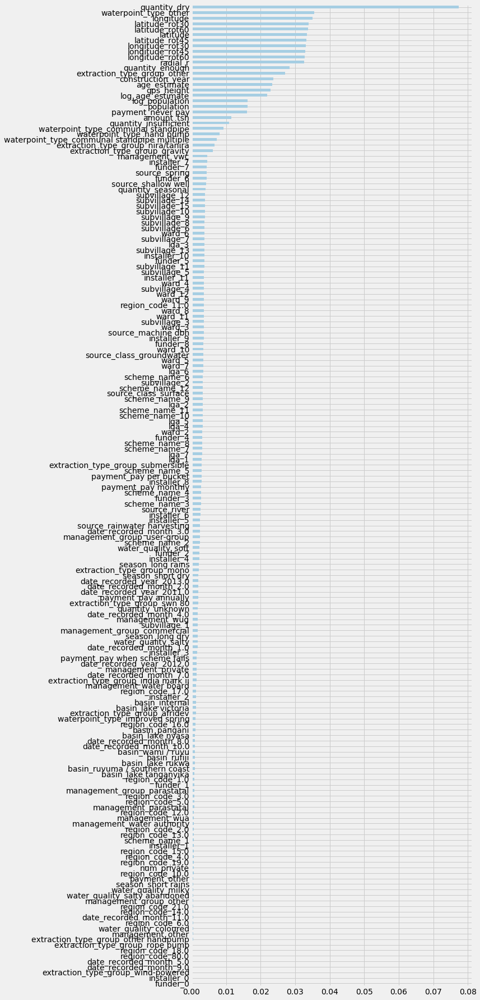

In [0]:
#first define the model and fit it on matrix X

model.fit(X, y)

importances = pd.Series(model.feature_importances_, X.columns)

#plot the feture importances importances for easy visual inspection:

figsize = (8,30)
plt.figure(figsize=figsize)
importances.sort_values().plot.barh()

###ELI5 Library

In [0]:
from eli5.sklearn import PermutationImportance
import eli5

permuter = PermutationImportance(model, scoring='accuracy', cv='prefit', 
                                 n_iter=3, random_state=42)

permuter.fit(X, y)
feature_names = X.columns.tolist()
eli5.show_weights(permuter, top=None, feature_names=feature_names)

In [0]:
#Make a dataframe of the elie_weights importances:
eli_importances_df = eli5.explain_weights_df(permuter, feature_names=feature_names)

#inspect the 20 features w/ least importance
eli_importances_df.sort_values(by='weight', ascending=False).tail(20)

##Visualizations

##Partial Dependence Plot

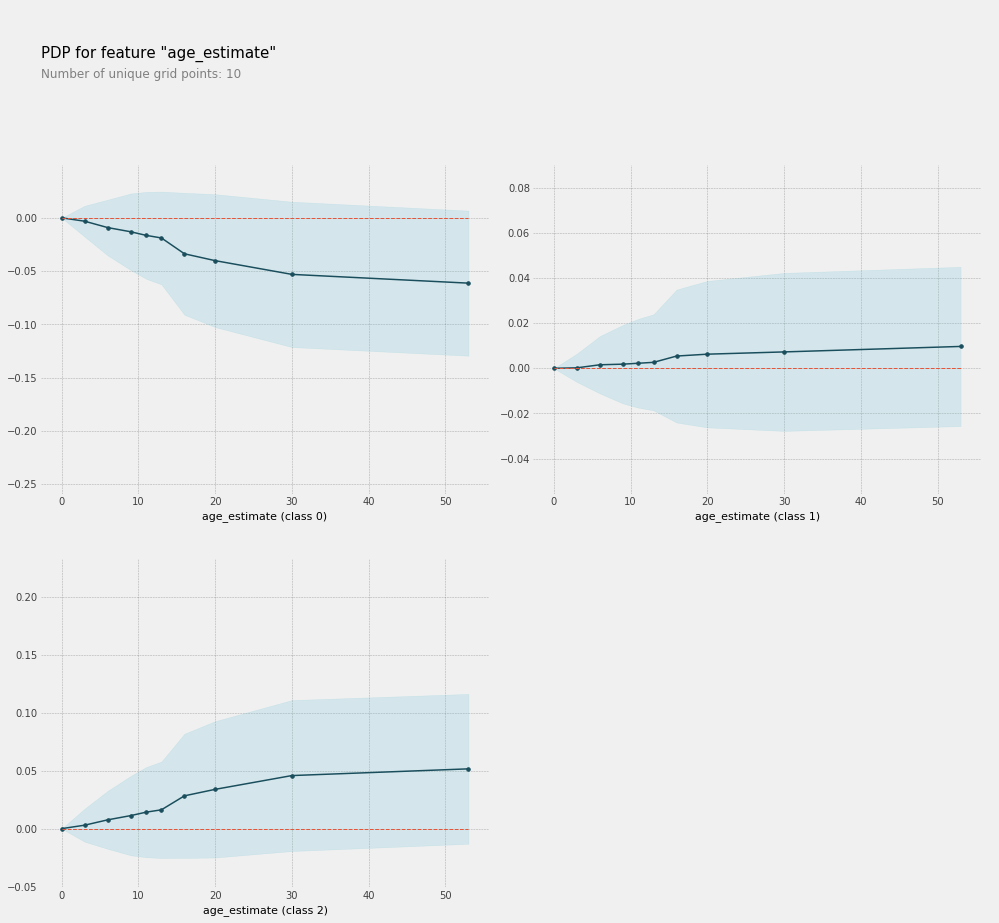

In [0]:
from pdpbox.pdp import pdp_isolate, pdp_plot

#feature chosen = 'age_estimate'

isolated = pdp_isolate(
      model = model,
      dataset = X,
      model_features = X.columns,
      feature = 'age_estimate'
  )

pdp_plot(isolated, feature_name = 'age_estimate');

###Quantity Feature -Target Distrubution bar chart

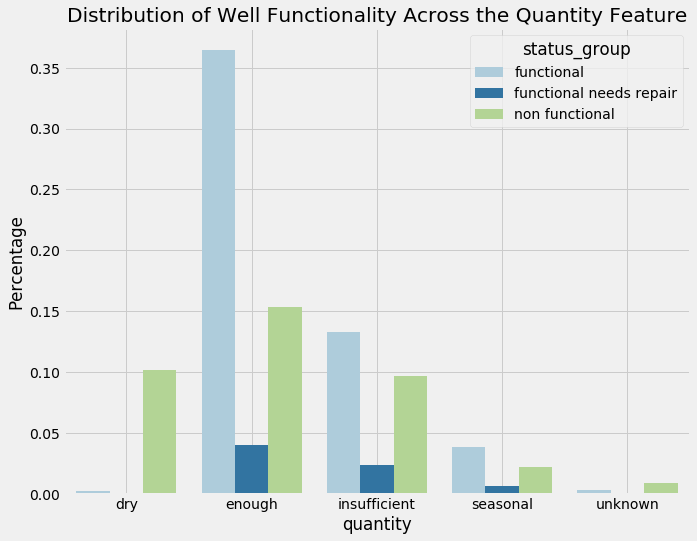

In [0]:
#merge train and target:
train = train.merge(train_target)

ct = pd.crosstab(train.quantity, train.status_group, normalize=True)

plt.style.use('fivethirtyeight')
fig, ax = plt.subplots(figsize = (10,8))

# now stack and reset
stacked = ct.stack().reset_index().rename(columns={0:'Percentage'})

# plot grouped bar chart
sns.set_palette(palette='Paired', n_colors=3)
sns.barplot(x=stacked.quantity, y=stacked.Percentage, hue=stacked.status_group)

ax.grid(axis='x')
plt.title('Distribution of Well Functionality Across the Quantity Feature')
plt.show()

###Confusion Matrix of Random Forest Model

                precision    recall  f1-score   support

    Functional       0.80      0.91      0.85      6452
  Needs Repair       0.63      0.29      0.40       863
Not-Functional       0.86      0.78      0.82      4565

      accuracy                           0.82     11880
     macro avg       0.76      0.66      0.69     11880
  weighted avg       0.81      0.82      0.81     11880



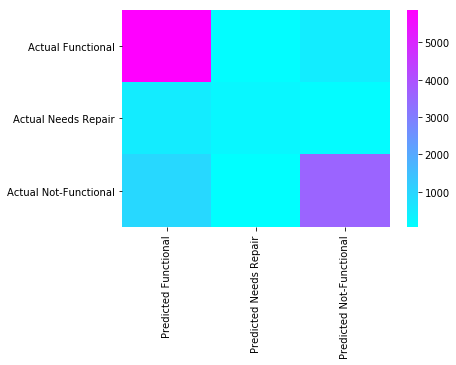

In [0]:
def con_matrix_analysis(model, X, y):
  from sklearn.model_selection import train_test_split
  from sklearn.metrics import classification_report, confusion_matrix
  
  X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=.2, 
                                                  random_state=42, stratify=y)
  
  model.fit(X_train, y_train)
  y_pred = model.predict(X_val)
  
  print(classification_report(y_val, y_pred,
        target_names=['Functional', 'Needs Repair', 'Not-Functional']))

  con_matrix = pd.DataFrame(confusion_matrix(y_val, y_pred), 
             columns=['Predicted Functional', 'Predicted Needs Repair', 'Predicted Not-Functional'], 
             index=['Actual Functional', 'Actual Needs Repair', 'Actual Not-Functional'])
                            
  sns.heatmap(data=con_matrix, cmap='cool')
  plt.show();
  return con_matrix

con_matrix = con_matrix_analysis(model, X, y)

###Plotly Express Geo scatter

In [0]:
#split combined back into train and test:

X_train = combined[combined.train_test == 'train'].drop(columns='train_test')
X_test = combined[combined.train_test == 'test'].drop(columns='train_test')

#merge train and target:
X_train = pd.concat([X_train, train_target], axis=1).drop(columns=['id'])

#establish X matrix and y target vectors:

target = 'status_group'
y = X_train[target]
X = X_train.drop(columns=[target])

In [0]:
!pip install plotly_express
import plotly_express as px

def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))
  
well_map_cols = ['latitude', 'longitude', 'status_group', 'age_estimate']
well_map = pd.concat([X_train[well_map_cols], train['quantity']], axis=1)

In [0]:
configure_plotly_browser_state()

px.scatter(well_map, x="longitude", y="latitude", color= "status_group", size='age_estimate',
           size_max=10,
           title = '.         Distribution of Water Well Functionality Across Tanzania- Size of Plots Scaled By Age of the Well',
           labels= {'status_group': ''})

##Submission of Predictions to Kaggle

In [0]:
def gen_submission(X, y, model, test):
  model.fit(X,y)
  y_pred = model.predict(test)
  submission = sample_submission.copy()
  submission['status_group'] = y_pred
  return submission

def download_submission(submission, filename):
  from google.colab import files 
  submission.to_csv(filename, index=False)
  files.download(filename)

In [0]:
from google.colab import files
uploaded = files.upload()

In [0]:
#submission stacking

# Filenames of your submissions you want to ensemble
files = ['submission-01.csv', 'submission-02.csv', 'submission-03.csv']

submissions = (pd.read_csv(file)[['status_group']] for file in files)
ensemble = pd.concat(submissions, axis='columns')
majority_vote = ensemble.mode(axis='columns')[0]

sample_submission = pd.read_csv('sample_submission.csv')
submission = sample_submission.copy()
submission['status_group'] = majority_vote
submission.to_csv('my-ultimate-ensemble-submission.csv', index=False)

def download_submission(submission, filename):
  from google.colab import files 
  submission.to_csv(filename, index=False)
  files.download(filename)

In [0]:
s = gen_submission(X, y, model, X_test)
download_submission(s, 'new_new_featuresRF_25depth_6split_140est.csv')

##Principal Component Analysis

###Dimension Reduction

Included here just to demonstrate my work- ultimately was not included in any model submissions bc of slightly lower accuracy score

In [0]:
#custom function

def pca_func(df, threshold, numeric_cols, show_scree_plot=True, scaled=False):
  '''
  Takes a pandas dataframe and a desired threshold, scales the numeric features 
  and performs principal component analysis dimension reduction, and returns
  a pandas dataframe of lower dimensionality and variance explained to the given
  threshold
    
  Parameters
  ----------
  X : pandas dataframe
      The dataframe containing data to perform PCA on
  threshold : The desired % of variance explained to be included in the return;
              must be an number between 0 and 100
  show_scree_plot : Bool indicating desire to display the % variance explained
                      by each principal component

  Returns
  -------
  dataframe:
      a pandas dataframe where the numeric columns have been scaled and 
      dimensions reduced to the number of principal components which explain
      the variance at a given threshold
  '''
  #confirm proper threshold input:
  if threshold < 0 or threshold > 100:
    return 'Incorrect threshold input, must be a number between 0 and 100'
  
  #library imports
  from sklearn.decomposition import PCA 
  from sklearn.preprocessing import StandardScaler 
  import seaborn as sns
  
  #use only the numeric columns
  #numeric_cols = df.select_dtypes(include='number').columns.tolist()
  X = df.copy()
  X = X[numeric_cols].values

  
  #scale the data:
  if scaled == False:
    scaler = StandardScaler()
    scaled_X = scaler.fit_transform(X)
  else:
    scaled_X = X
  
  #calc the principal component variance
  n = len(numeric_cols)
  covar_matrix = PCA(n_components = n)
  covar_matrix.fit(scaled_X)
  
  ##calculate variance ratios
  variance = covar_matrix.explained_variance_ratio_
  cumulative_var = np.cumsum(np.round(covar_matrix.explained_variance_ratio_, decimals=3)*100)
  
  #plot it:
  if show_scree_plot:
    y_vals = [num for num in cumulative_var]
    x_vals = [num for num in range(1,n+1)]

    fig, ax = plt.subplots(figsize=(10,8))
    ax.grid(True)
    ax.set_title('Principal Components Cumulative Variance')
    ax.set_ylabel('Cumulative Variance % Explained')
    ax.set_xlabel('Principal Components')
    # threshold var
    ax.axhline(threshold, color='g');
    sns.barplot(x=x_vals, y=y_vals, ax=ax, color='#769ddb')
    plt.show()
    
  #function for calculating number of principal components to use:
  def calc_num_components(cum_var, threshold):
    for i in range(n):
      if cum_var[i] >= threshold:
        return i+1
  
  #call the function to calulate num_components:
  n_components = calc_num_components(cumulative_var, threshold)
  
  # create the PCA instance
  pca = PCA(n_components = n_components)

  principal_components = pca.fit_transform(scaled_X)

  #convert to pandas df:
  pc_df = pd.DataFrame(data = principal_components, 
                       columns = ['component_' + str(i) for i in range(n_components)]).reset_index(drop=True)
  
  
  #return df which is original df w/ the numeric cols dropped and replaced w/
  #principal components df
  df = df.drop(columns = numeric_cols).reset_index(drop=True)
  df = pd.concat([df, pc_df], axis=1)
  return df

This code is  a bit messy, was sort of complicated because some of the data had already been scaled and some hadnt, so basically ran the function twice and then merged back together

###Run Model w/ the transformed PCA data

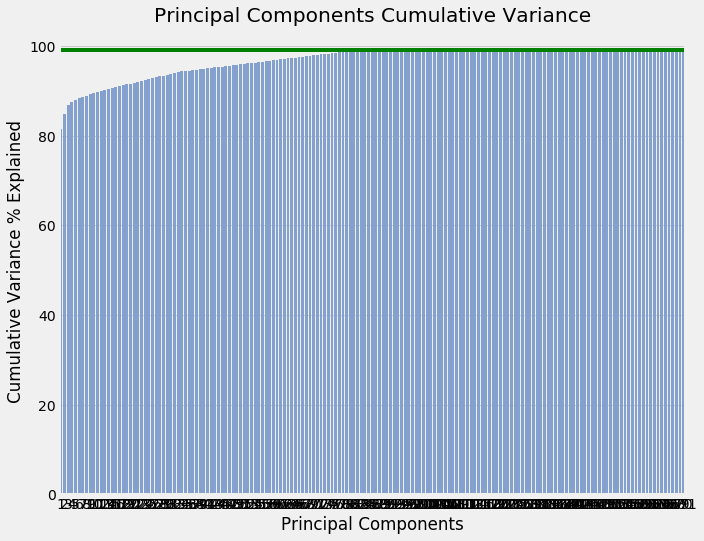

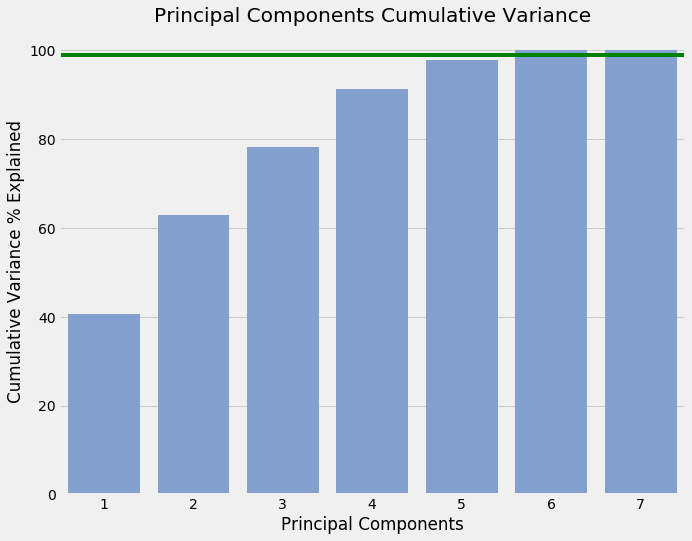

,train_test,component_0,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10,component_11,component_12,component_13,component_14,component_15,component_16,component_17,component_18,component_19,component_20,component_21,component_22,component_23,component_24,component_25,component_26,component_27,component_28,component_29,component_30,component_31,component_32,component_33,component_34,component_35,component_36,component_37,component_38,component_39,component_40,component_41,component_42,component_43,component_44,component_45,component_46,component_47,component_48,component_49,component_50,component_51,component_52,component_53,component_54,component_55,component_56,component_57,component_58,component_59,component_60,component_61,component_62,component_63,component_64,component_65,component_66,component_67,component_68,component_69,component_70,component_71,component_72,component_73,component_74,component_75,component_76,component_77,component_78,component_79,component_80,component_81,component_82,component_83,component_84,component_85,component_86,component_87
0,train,-0.466053,-2.116843,2.144555,-1.384619,-0.747932,-0.278669,-0.587086,0.481668,-0.750034,-0.681925,0.987616,0.481238,0.176616,-1.097734,0.042281,-0.233673,-0.519237,0.549003,0.066669,0.062894,0.294583,0.178686,-0.703831,0.880885,-0.175791,-0.570397,0.168048,-0.189205,-0.340146,-0.159986,0.112026,-0.593984,-0.468760,-0.164917,0.288710,0.685070,-0.619904,0.121046,-0.096908,0.472511,0.531612,0.215535,0.314138,0.262993,0.396936,-0.177981,0.093613,-0.164308,0.015586,0.714472,-0.238250,0.349378,0.312970,-0.148373,0.042234,0.387133,-0.438715,0.448833,-0.238937,0.117078,0.182713,-0.355788,-0.330703,-0.276593,0.186314,-0.148325,-0.543543,0.474359,-0.768662,-0.849165,0.027741,-0.041720,-0.294989,0.089473,0.521725,-0.262004,-0.033702,0.277515,0.080834,-0.011261,0.105555,-0.064377,-0.049731,0.068321,1.563790,0.383840,-0.229094,-0.242629
1,train,-0.463912,1.994513,-1.678825,-1.127985,0.148465,-0.382415,1.033316,0.626171,0.112182,1.239813,0.872526,-0.413534,0.385466,-0.585607,-1.185463,0.119733,-0.892943,0.351550,-0.226208,-0.274989,-0.392252,0.172428,-0.498278,0.074396,-0.245493,-0.309387,0.239084,0.290075,0.328863,-0.319490,-0.034821,-1.270813,0.138009,-0.355467,0.510953,-0.278961,-0.095922,0.292950,0.133641,0.379056,0.780655,0.619017,0.072068,0.256690,0.836240,-0.296199,-0.072015,-0.287742,-0.410273,-0.342282,0.304947,-0.255808,-0.571390,0.512419,0.137504,-0.031417,-0.730628,0.106742,-0.449128,0.113555,-0.214499,0.358393,-0.244477,-0.324414,0.050604,-0.327927,-0.485041,-0.182551,-0.227933,0.104861,0.082329,-0.367406,0.046538,-0.200586,0.386493,-0.006942,-0.370249,0.117366,0.127286,-0.351311,0.227599,0.044063,-2.039700,0.666592,0.414552,-0.577465,-0.182923,0.303911
2,train,-0.447451,-0.327322,-2.259699,-0.373983,1.329111,0.073893,0.499668,0.540705,0.254154,0.496218,0.204840,0.357833,0.563955,-0.573816,0.256236,0.000709,-0.831550,0.634278,-0.589954,-0.698284,-0.883712,0.386614,-1.281979,0.757514,-0.544827,-0.404510,0.450075,-0.335690,0.114598,-0.080421,-0.433380,-0.640726,-0.180590,-0.567775,0.702787,0.045899,-0.299124,0.363000,-0.189873,0.194225,0.265539,0.177015,0.234637,-0.215556,0.400175,-0.250422,-0.203566,-0.309950,-0.251958,0.606186,-0.133448,0.667945,0.943075,0.045827,-0.272293,-0.088302,-0.663093,0.098396,-0.172522,0.482937,-0.039062,0.071994,0.161257,-0.203641,-0.283616,-0.011700,-0.422434,0.311770,0.081915,-0.699966,0.699519,0.509721,0.063404,-0.410290,0.067237,-0.519146,0.086969,0.623326,-0.275928,0.027854,0.342700,-0.217998,-1.857317,0.227843,-0.392655,0.131100,-0.532367,0.059323
3,train,-0.445899,-4.392095,0.857220,1.443471,0.980450,-0.499095,-0.581853,-0.701228,0.654009,0.120762,1.416190,0.990854,0.600898,-0.944470,-0.832448,-0.367420,-0.504436,-0.239605,0.424886,-0.307341,0.333249,0.525676,-0.425991,0.059743,-0.331559,-0.324690,0.300053,0.207871,-0.042283,0.420768,0.401872,0.197559,-0.772329,-

In [0]:
unscaled_cols = ['gps_height', 'log_population', 'population', 'log_age_estimate',
                 'age_estimate', 'amount_tsh', 'construction_year']

#The rest of df is already scaled: numeric location info prior to feature engineering
scaled_cols = combined.drop(columns=unscaled_cols).drop(columns='train_test').columns.tolist()


combined_pca = pca_func(combined, 99, scaled_cols, scaled=True)

column_map = {'component_0': 'component_82',	'component_1': 'component_83', 
              'component_2': 'component_84', 'component_3':'component_85',	
              'component_4': 'component_86', 'component_5': 'component_87'}

unscaled = pca_func(combined, 99, unscaled_cols).rename(columns=column_map)

unscaled = unscaled[['component_82', 'component_83', 'component_84', 'component_85',
                     'component_86', 'component_87']]
combined_pca = pd.concat([combined_pca, unscaled], axis=1).drop(columns=unscaled_cols)

combined_pca.head()

In [0]:
combined_pca.shape

(73758, 89)

In [0]:
#split combined_pca into train and test:

X_train = combined_pca[combined_pca.train_test == 'train'].drop(columns='train_test')
X_test = combined_pca[combined_pca.train_test == 'test'].drop(columns='train_test')

#merge train and target:
X_train = pd.concat([X_train, train_target], axis=1).drop(columns=['id'])

#establish X matrix and y target vectors:

target = 'status_group'
y = X_train[target]
X = X_train.drop(columns=[target])

In [0]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=.15, 
                                                  random_state=12, stratify=y)

model.fit(X_train, y_train)
print('Accuracy score: ' + str(model.score(X_val, y_val)))

Accuracy score: 0.7962962962962963
